# Overview of Working with Images

By leveraging the power of some common libraries that you can install, such as PILLOW, Python gains the ability to work with and manipulate images for simple tasks. You can install Pillow by running:

    pip install pillow
    
In case of any issues, you can refer to their [official documentation](http://pillow.readthedocs.io/en/3.4.x/installation.html) on installation. But for most computers, the simple pip install method should work.

---
____
**Note: When working with images in the jupyter notebook, you may get the following warning:**

    IOPub data rate exceeded.
    The notebook server will temporarily stop sending output
    to the client in order to avoid crashing it.
    To change this limit, set the config variable
    `--NotebookApp.iopub_data_rate_limit`.
    
**If you get this warning, try stopping the notebook at the command line, then restarting it with:**

    jupyter notebook --NotebookApp.iopub_data_rate_limit=1.0e10
    
** At the command line. Basically this adds a "flag" that the limit should be raised during this session of jupyter notebook that you are running.**


----


# Working with Pillow Library

## Opening Images

You can use Pillow to open image files. For a jupyter notebook, to show the file simply type the variable name holding the image. For other IDEs , the image variable will have a [.show() method.](https://stackoverflow.com/questions/28139637/how-can-i-display-an-image-using-pillow)

In [95]:
from PIL import Image

In [96]:
mac = Image.open('./images/example.jpg')

In [97]:
# Note this is a specialized file type from PIL (pillow)
type(mac)

PIL.JpegImagePlugin.JpegImageFile

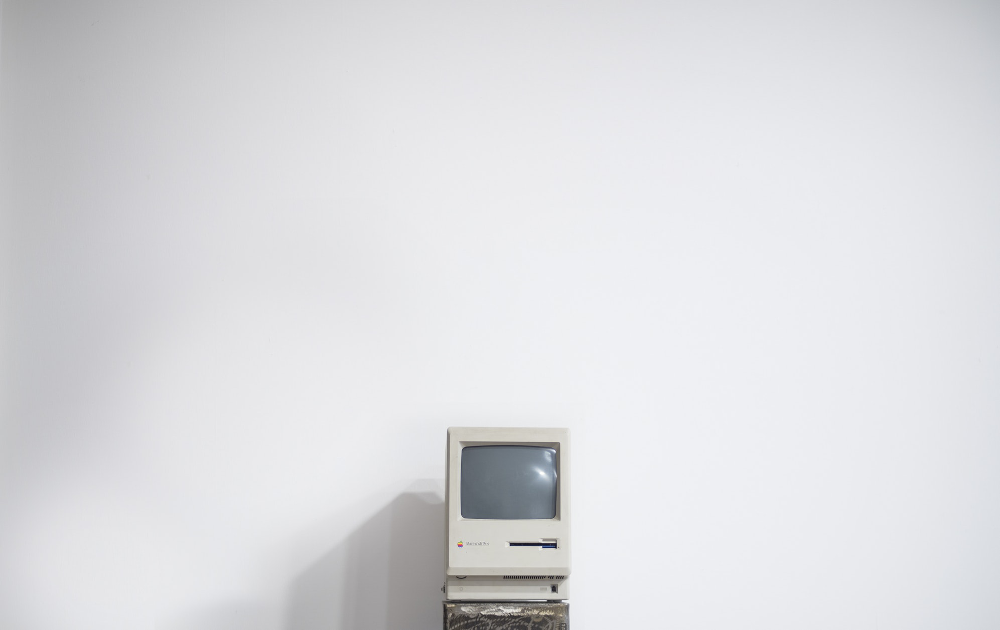

In [98]:
# Only for jupyter notebook , use mac.show() for other IDEs 
mac

### Image Information

In [99]:
# (width, height)
mac.size

(1993, 1257)

In [100]:
mac.filename

'./images/example.jpg'

In [101]:
mac.format_description

'JPEG (ISO 10918)'

## Cropping Images

To crop images (that is grab a sub section) you can use the crop() method on the image object. The crop() method returns a rectangular region from this image. The box is a 4-tuple defining the left, upper, right, and lower pixel coordinate.

Note! If you take a look at the documentation string, it says the tuple you pass in is defined as (x,y,w,h). These variables can be a bit decieving. Its not really a height or width that is being passed, but instead the end coordinates of your width and height.


All the coordinates of box (x, y, w, h) are measured from the top left corner of the image. Again, all 4 of these values are coordinates!

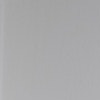

In [102]:
mac.crop((0,0,100,100))

For the mac image this isn't a very useful demonstration. Let's use another image instead:

In [103]:
pencils = Image.open("./images/pencils.jpg")

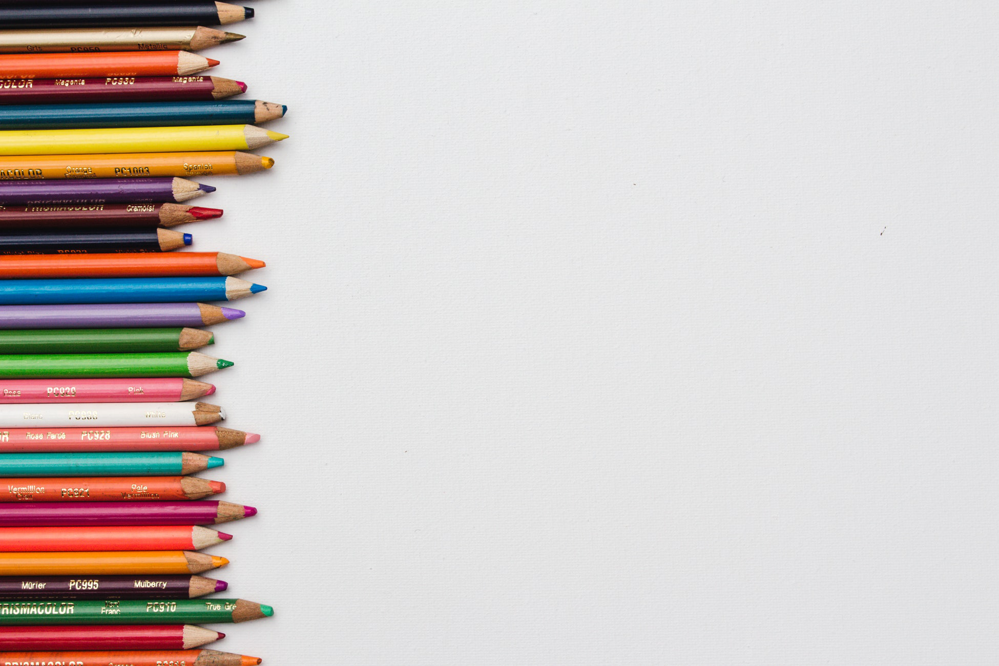

In [104]:
pencils

Now let's attempt to grab some of the top pencils from the corner

In [105]:
pencils.size

(1950, 1300)

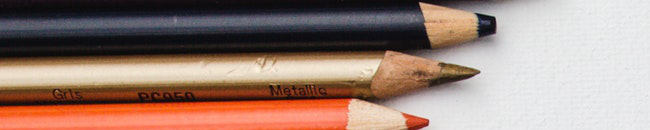

In [106]:
# Start at top corner (0,0)
x = 0
y = 0

# Grab about 10% in y direction , and about 30% in x direction
w = 1950/3
h = 1300/10

pencils.crop((x,y,w,h))

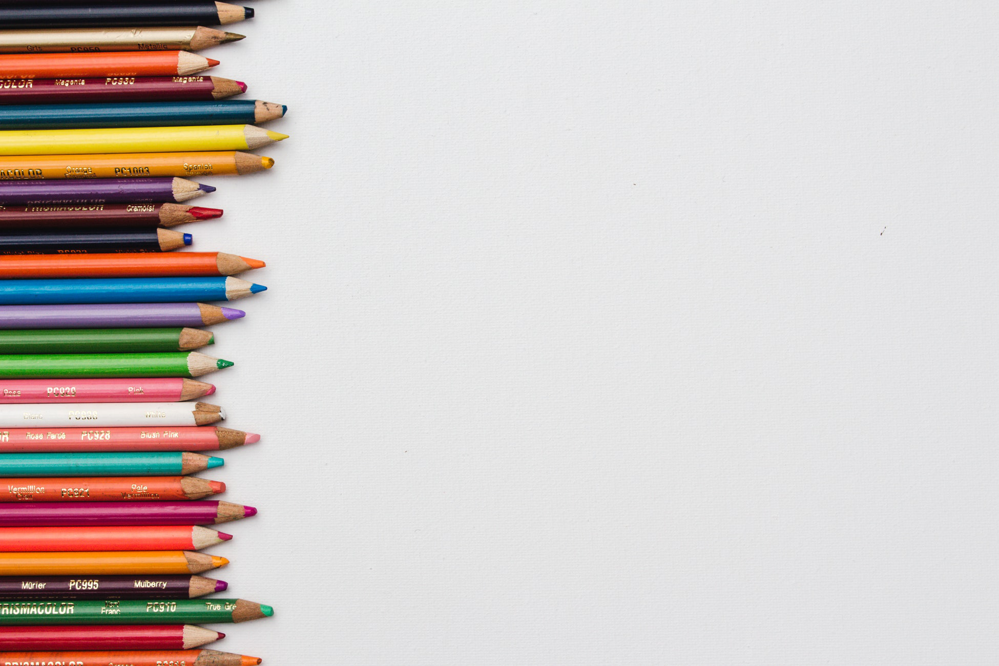

In [107]:
pencils

Now let's try the pencils from the bottom

In [108]:
pencils.size

(1950, 1300)

In [109]:
x = 0 
y = 1100
w = 1950/3
h = 1300

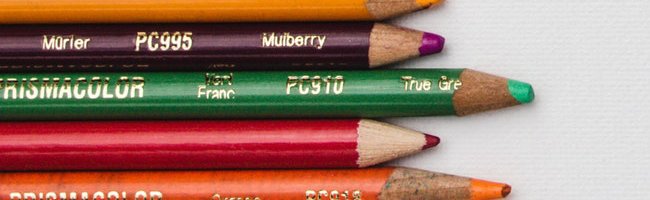

In [110]:
pencils.crop((x,y,w,h))

Now let's go back to the mac photo and see if we can only grab the computer itself:

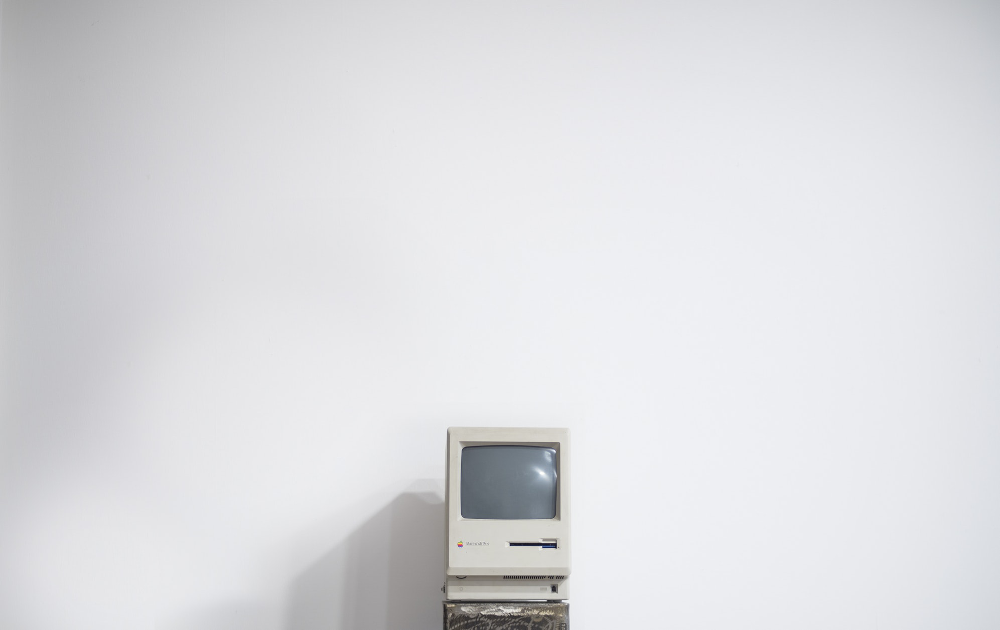

In [111]:
mac

In [112]:
mac.size

(1993, 1257)

In [113]:
halfway = 1993/2

In [114]:
x = halfway - 200
w = halfway + 200

In [115]:
y = 800
h = 1257

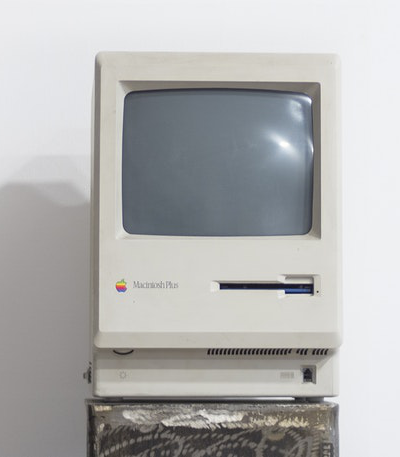

In [116]:
mac.crop((x,y,w,h))

### Copying and Pasting Images

We can create copies with the copy() method and paste images on top of others with the paste() method.

In [117]:
computer = mac.crop((x,y,w,h))

In [118]:
mac.paste(im=computer,box=(0,0))

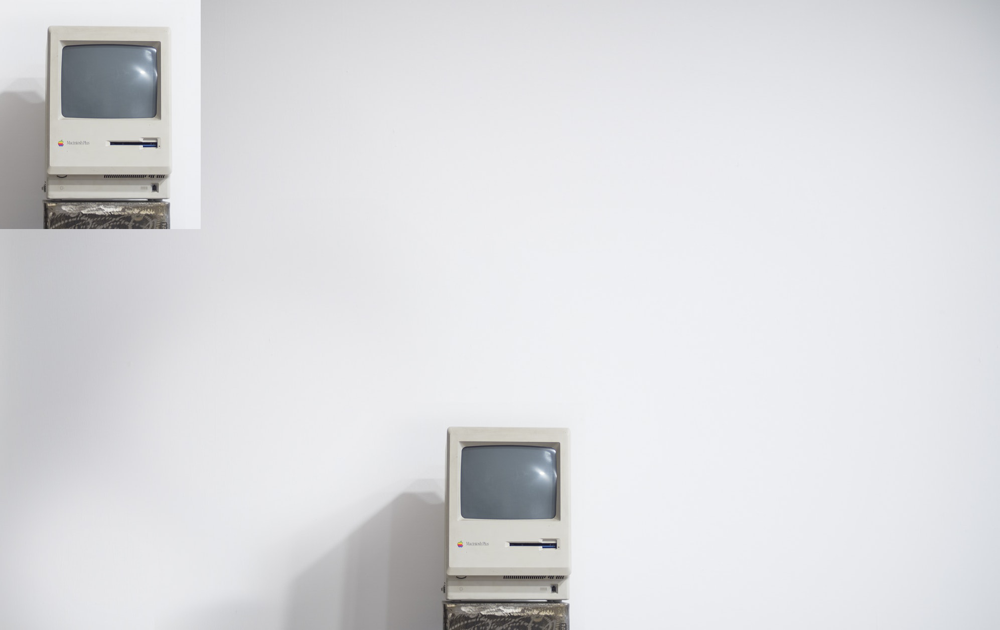

In [119]:
mac

In [120]:
mac.paste(im=computer,box=(796,0))

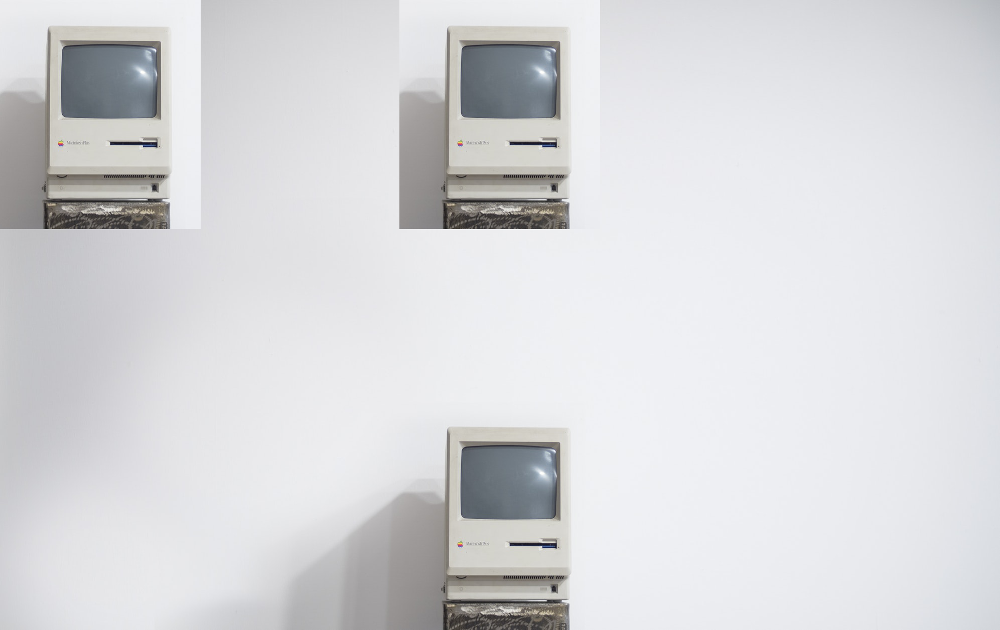

In [121]:
mac

### Resizing

You can use the resize() method to resize an image

In [122]:
mac.size

(1993, 1257)

In [123]:
h,w = mac.size

In [124]:
new_h = int(h/3)
new_w = int(w/3)

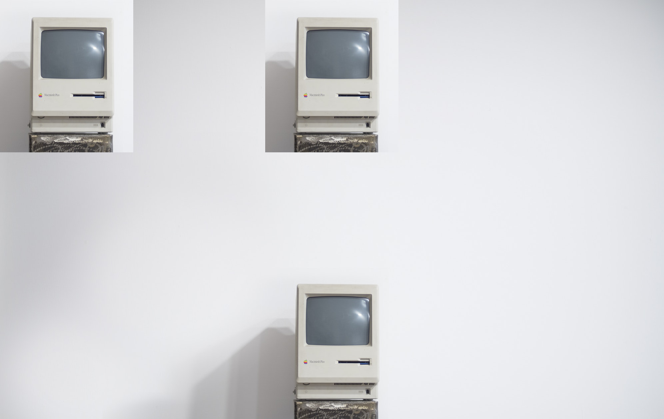

In [125]:
# Note this is not permanent change
# for permanent change, do a reassignment
# e.g. mac = mac.resize((100,100))
mac.resize((new_h,new_w))

Can also stretch and squeeze

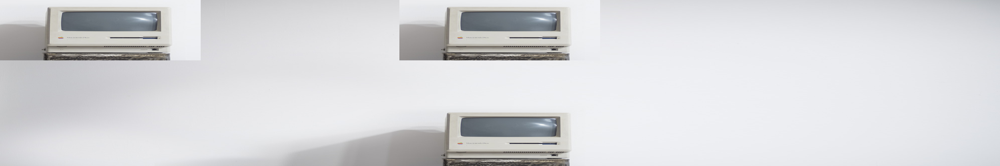

In [126]:
mac.resize((3000,500))

### Rotating Images

You can rotate images by specifying the amount of degrees to rotate on the rotate() method. The original dimensions will be kept and "filled" in with black. You can optionally pass in the expand parameter to fill the new rotated image to the old dimensions.

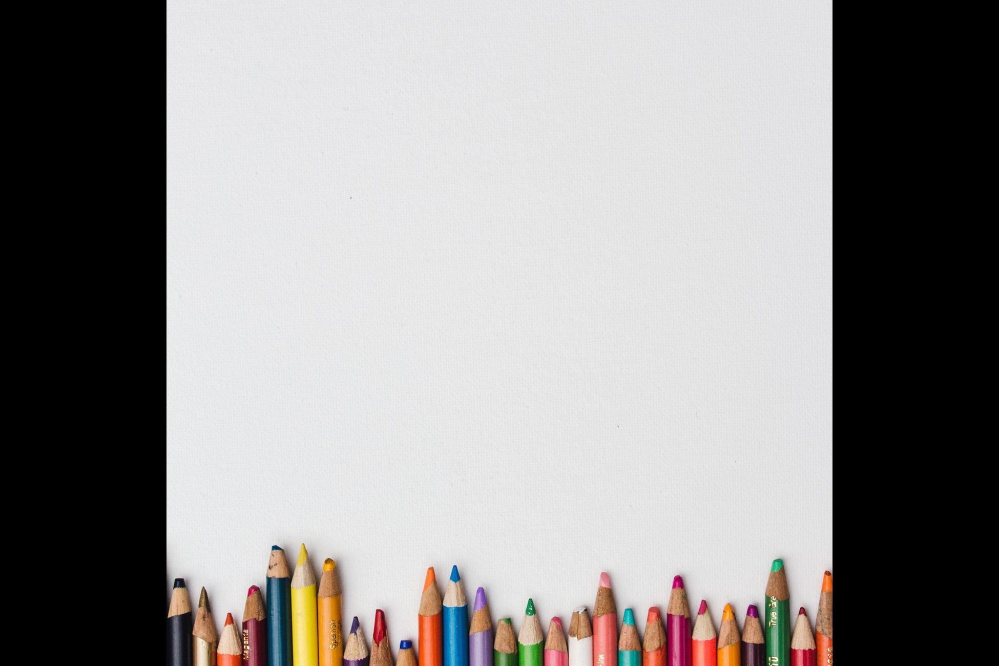

In [127]:
pencils.rotate(90)

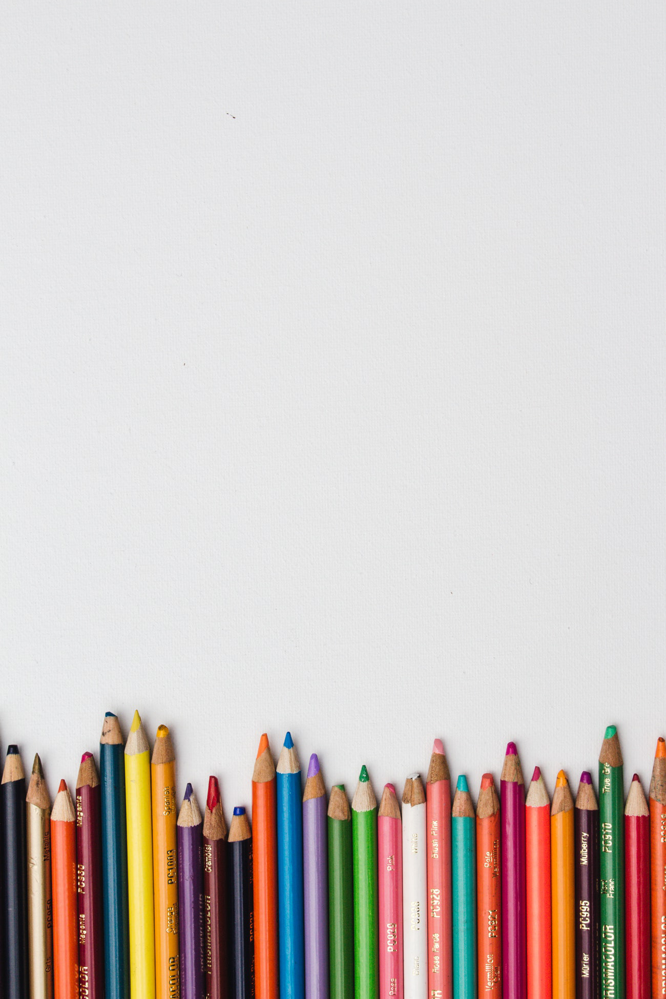

In [128]:
pencils.rotate(90,expand=True)

Notice what happens when we rotate by 120.

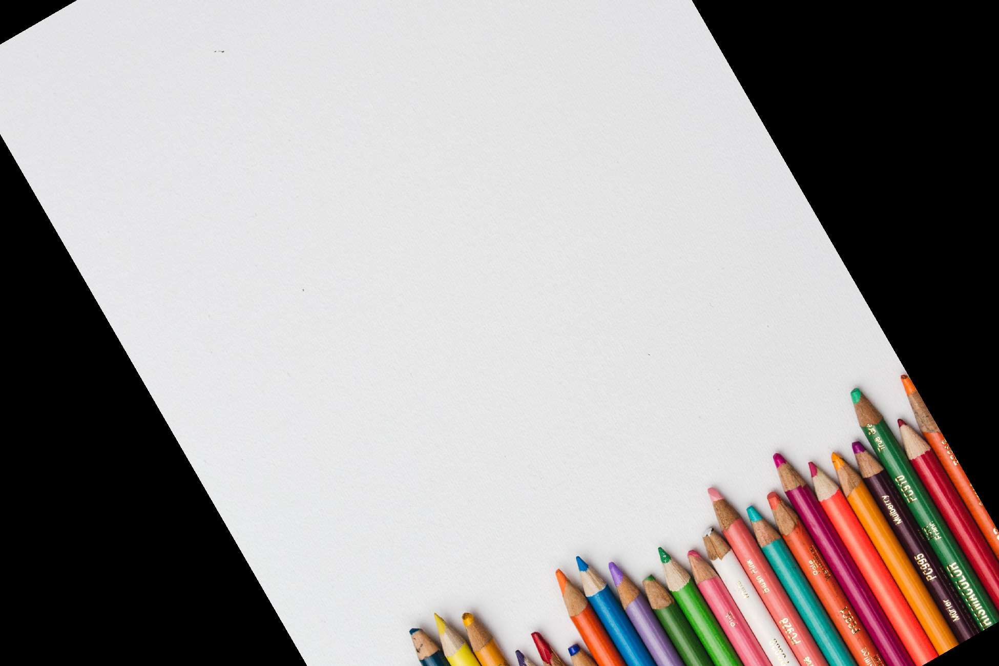

In [129]:
# The image is cut off
pencils.rotate(120)

In [130]:
#pencils.rotate(120,expand=True)

## Transparency  

We can add an alpha value (RGBA stands for RED,Green,Blue, Alpha) where values can go from 0 to 255. If Alpha is 0 the image is completely transparent, if it is 255 then its completely opaque.

You can create your own color here to check for possible values: https://developer.mozilla.org/en-US/docs/Web/CSS/CSS_Colors/Color_picker_tool

We can adjust image alpha values with the putalpha() method:

In [131]:
red = Image.open('./images/red_color.jpg')

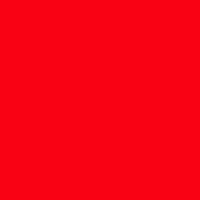

In [132]:
red

In [133]:
blue = Image.open('./images/blue_color.png')

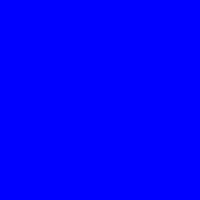

In [134]:
blue

In [135]:
red.putalpha(128)

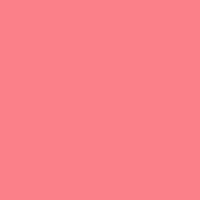

In [136]:
red

In [137]:
blue.putalpha(128)

In [138]:
blue

<PIL.PngImagePlugin.PngImageFile image mode=PA size=200x200>

In [139]:
blue.paste(red,box=(0,0),mask=red)

In [140]:
# Get back an image that is more purple.
blue

<PIL.PngImagePlugin.PngImageFile image mode=PA size=200x200>

Transparency and masking can be much more complex than what we've shown here, if you find yourself needing something more, check out the documentation: https://pillow.readthedocs.io/en/stable/

## Saving Images

Let's save this updated "blue" image as 'purple.png' in this folder.

In [141]:
# Convert the image to 'RGBA' mode before saving
blue.convert("RGBA").save("./images/purple.png")

Let's check to make sure that worked:

In [142]:
purple = Image.open("./images/purple.png")

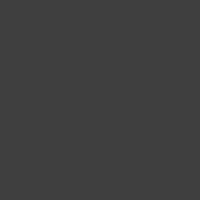

In [143]:
purple

Great job!